
<img src="../images/importing_libraries_final.png" width='800px' height="50px">

In [4]:
import pandas as pd
import numpy as np
from  sklearn.preprocessing import OneHotEncoder,OrdinalEncoder,LabelEncoder
from sklearn.svm import SVC
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
import plotly.express as px
import plotly.graph_objects as pgo
import plotly.figure_factory as pff
import catboost
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.metrics import accuracy_score,classification_report,precision_score
import warnings 
warnings.filterwarnings('ignore')
from termcolor import colored
from sklearn.compose import ColumnTransformer
from xgboost import XGBRFClassifier
from sklearn.ensemble import StackingClassifier,BaggingClassifier
from catboost import CatBoostClassifier
import pickle as pkl

In [5]:
df=pd.read_csv('../data/stress_data.csv')[["Gender","Age","Occupation","Sleep Duration","Quality of Sleep","Stress Level"]]

In [6]:
df

,Gender,Age,Occupation,Sleep Duration,Quality of Sleep,Stress Level
0,Male,27,Software Engineer,6.1,6,Medium
1,Male,28,Doctor,6.2,6,High
2,Male,28,Doctor,6.2,6,High
3,Male,28,Sales Representative,5.9,4,High
4,Male,28,Sales Representative,5.9,4,High
...,...,...,...,...,...,...
369,Female,59,Nurse,8.1,9,Low
370,Female,59,Nurse,8.0,9,Low
371,Female,59,Nurse,8.1,9,Low
372,Female,59,Nurse,8.1,9,Low



<img src="../images/eda.png" width='800px' height="50px">

[]

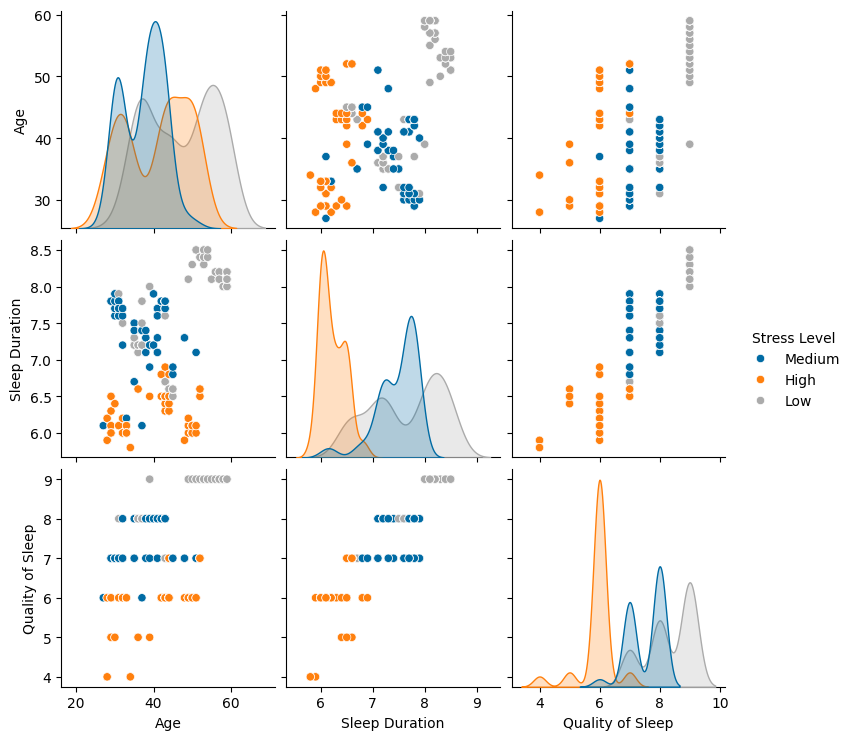

In [7]:

plt.style.use('tableau-colorblind10')
sns.pairplot(data=df,hue='Stress Level')
plt.plot()


In [8]:
classes=colored(df['Stress Level'].unique(), "magenta",None, attrs=["blink"])
print('The outputs from the classification are :',classes)

The outputs from the classification are : ['Medium' 'High' 'Low']


In [9]:
df["Stress Level"].value_counts()

Stress Level
Low       141
High      120
Medium    113
Name: count, dtype: int64

In [10]:
fig=px.histogram(df,x='Stress Level', 
                 barmode="group",color='Stress Level',
                 color_discrete_sequence=['#C39BD3','#4A235A','white'],
                 text_auto=True)    
fig.update_layout(title='<b>Distribution of persons have Stress level </b>..',
                 title_font={'size':25},
                 paper_bgcolor='#EBDEF0',
                 plot_bgcolor='#EBDEF0',
                 showlegend=True)
fig.update_yaxes(showgrid=False)

fig.show()

In [11]:
fig = px.bar(df, x="Gender", y="Stress Level", barmode="group",color='Stress Level',
                 color_discrete_sequence=['#C39BD3','#4A235A','#ff00ff'],title="Gender-Stress Level")
fig.show()

In [12]:
fig=px.histogram(df,x='Occupation',color='Stress Level',text_auto=True,color_discrete_sequence=['rgba(39, 39, 250, 0.7)','rgba(39, 39, 210, 0.9)','rgba(39, 39, 153, 0.5)'])
fig.show()


In [13]:
ranges = [(0, 19, 'Low'), (20, 38, 'Medium'), (39, max(df['Age']), 'High')]

def categorize_age(age):
    for r in ranges:
        if r[0] <= age <= r[1]:
            return r[2]
    return 'Undefined'
df['Age Range'] = df['Age'].apply(categorize_age)
count_data = df.groupby(['Age', 'Stress Level']).size().unstack(fill_value=0)

fig = pgo.Figure()

for stress_level in count_data.columns:
    fig.add_trace(pgo.Bar(
        x=count_data.index,
        y=count_data[stress_level],
        name=stress_level,
        
    ))

fig.update_layout(
    title='Stress Level by Age Range',
    xaxis=dict(title='Age Range'),
    yaxis=dict(title='Count'),
    barmode='stack',
    
)

fig.show()

In [14]:
sleep_ranges = [(4, 6, 'Low'), (6, 8, 'Medium'), (8, 10, 'High')]  # Define sleep duration ranges as needed

def categorize_age(age):
    for r in sleep_ranges:
        if r[0] <= age <= r[1]:
            return r[2]
    return 'Undefined'
df['Sleep Duration Range'] = df['Sleep Duration'].apply(categorize_age)
count_data = df.groupby(['Sleep Duration', 'Stress Level']).size().unstack(fill_value=0)

fig = pgo.Figure()

for stress_level in count_data.columns:
    fig.add_trace(pgo.Bar(
        x=count_data.index,
        y=count_data[stress_level],
        name=stress_level,
        
    ))

fig.update_layout(
    title='Stress Level by Sleep Duration Range',
    xaxis=dict(title='Sleep Range'),
    yaxis=dict(title='Count'),
    barmode='stack',
    
)

fig.show()
df.drop(['Age Range','Sleep Duration Range'],axis=1,inplace=True)

In [15]:
df.head().style.set_properties(**{'background-color': '#4A235A',
                                          'color': 'white'}) #for colored output

,Gender,Age,Occupation,Sleep Duration,Quality of Sleep,Stress Level
0,Male,27,Software Engineer,6.100000,6,Medium
1,Male,28,Doctor,6.200000,6,High
2,Male,28,Doctor,6.200000,6,High
3,Male,28,Sales Representative,5.900000,4,High
4,Male,28,Sales Representative,5.900000,4,High


In [16]:
shape = colored(df.shape, "magenta",None, attrs=["blink"])
print('The dimention of data is :',shape)

The dimention of data is : (374, 6)


In [17]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 374 entries, 0 to 373
Data columns (total 6 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   Gender            374 non-null    object 
 1   Age               374 non-null    int64  
 2   Occupation        374 non-null    object 
 3   Sleep Duration    374 non-null    float64
 4   Quality of Sleep  374 non-null    int64  
 5   Stress Level      374 non-null    object 
dtypes: float64(1), int64(2), object(3)
memory usage: 17.7+ KB


In [18]:
df.describe().style.background_gradient(cmap='Blues_r')

,Age,Sleep Duration,Quality of Sleep
count,374.000000,374.000000,374.000000
mean,42.184492,7.132086,7.312834
std,8.673133,0.795657,1.196956
min,27.000000,5.800000,4.000000
25%,35.250000,6.400000,6.000000
50%,43.000000,7.200000,7.000000
75%,50.000000,7.800000,8.000000
max,59.000000,8.500000,9.000000



<img src="../images/data_preprocessing.png" width='800px' height="50px">

In [19]:
df.isnull().sum()

Gender              0
Age                 0
Occupation          0
Sleep Duration      0
Quality of Sleep    0
Stress Level        0
dtype: int64

In [20]:
#Make other category in Occupation where count<35
ThreshHold=35
for index,value in zip(df["Occupation"].value_counts().index,df["Occupation"].value_counts().values):
    if value<ThreshHold:
        df["Occupation"][df["Occupation"]==index]='Other'

In [21]:
df["Occupation"].value_counts()

Occupation
Nurse         73
Doctor        71
Engineer      63
Lawyer        47
Other         43
Teacher       40
Accountant    37
Name: count, dtype: int64

In [22]:
X=df.iloc[:,:-1]
y=df.iloc[:,-1]

In [23]:
#CONVERT CATEGORICAL COLUMN TO NUMERICAL COLUMN USING ONEHOTENCODER

ot_occuapation=OneHotEncoder(drop='first',sparse_output=False)
ot_gender=OneHotEncoder(drop='first',sparse_output=False)


arr_occupation=ot_occuapation.fit_transform(df[["Occupation"]])
arr_gender=ot_gender.fit_transform(df[["Gender"]])


X.drop(["Gender","Occupation"],axis=1,inplace=True)
X_Transformed=np.hstack([X.values,arr_occupation,arr_gender])





In [24]:
#CONVERT CATEGORICALOuput COLUMN TO NUMERICAL COLUMN USING OrdinalEncoder
lt=OrdinalEncoder(categories=[["Low","Medium","High"]],dtype=np.int32)
arr_stress_level=lt.fit_transform(df[["Stress Level"]])
y_transformed=arr_stress_level


<img src="../images/data_splitting.png" width='800px' height="50px">

In [25]:
x_train,x_test,y_train,y_test=train_test_split(X_Transformed,y_transformed,test_size=0.2,random_state=43)

In [26]:
#USING LOGISTIC REGRESSION
lr=LogisticRegression()
lr.fit(x_train,y_train)
accuracy_score(lr.predict(x_test),y_test)

0.9733333333333334

In [27]:
#USING Support Vector Machine 
svc=SVC()
svc.fit(x_train,y_train)
accuracy_score(svc.predict(x_test),y_test)

0.68

In [28]:
#USING Random Forest Classifier
rf=RandomForestClassifier()
rf.fit(x_train,y_train)
accuracy_score(rf.predict(x_test),y_test)

0.9733333333333334

In [29]:
#USING Xgboost Classifier
xg=XGBRFClassifier()
xg.fit(x_train,y_train)
accuracy_score(xg.predict(x_test),y_test)

0.96

In [30]:
#USING CatBoost Classifier
cb=CatBoostClassifier()
cb.fit(x_train,y_train)
accuracy_score(cb.predict(x_test),y_test)

Learning rate set to 0.074402
0:	learn: 0.9998873	total: 148ms	remaining: 2m 27s
1:	learn: 0.9260045	total: 149ms	remaining: 1m 14s
2:	learn: 0.8601278	total: 151ms	remaining: 50.1s
3:	learn: 0.7961401	total: 152ms	remaining: 37.9s
4:	learn: 0.7461751	total: 154ms	remaining: 30.6s
5:	learn: 0.6974405	total: 155ms	remaining: 25.6s
6:	learn: 0.6535731	total: 156ms	remaining: 22.1s
7:	learn: 0.6192764	total: 157ms	remaining: 19.5s
8:	learn: 0.5869513	total: 158ms	remaining: 17.4s
9:	learn: 0.5552719	total: 160ms	remaining: 15.8s
10:	learn: 0.5252260	total: 162ms	remaining: 14.5s
11:	learn: 0.4985980	total: 163ms	remaining: 13.4s
12:	learn: 0.4776752	total: 164ms	remaining: 12.5s
13:	learn: 0.4556012	total: 166ms	remaining: 11.7s
14:	learn: 0.4339220	total: 167ms	remaining: 11s
15:	learn: 0.4123055	total: 169ms	remaining: 10.4s
16:	learn: 0.3964692	total: 170ms	remaining: 9.83s
17:	learn: 0.3795853	total: 172ms	remaining: 9.4s
18:	learn: 0.3653799	total: 174ms	remaining: 8.97s
19:	learn: 0

0.9866666666666667

In [333]:
# USING STACKING METHOD
st=StackingClassifier(estimators=[('lr',lr),('rf',rf),('svc',svc),('xg',xg)],final_estimator=cb,cv=5)
st.fit(x_train,y_train)
accuracy_score(st.predict(x_test),y_test)

Learning rate set to 0.074402
0:	learn: 1.0019760	total: 6.49ms	remaining: 6.49s
1:	learn: 0.9198371	total: 10.2ms	remaining: 5.11s
2:	learn: 0.8434985	total: 14.5ms	remaining: 4.81s
3:	learn: 0.7696098	total: 18ms	remaining: 4.48s
4:	learn: 0.7047647	total: 21.9ms	remaining: 4.36s
5:	learn: 0.6533792	total: 25.6ms	remaining: 4.24s
6:	learn: 0.6034776	total: 30.1ms	remaining: 4.26s
7:	learn: 0.5586708	total: 34.1ms	remaining: 4.23s
8:	learn: 0.5200118	total: 37.7ms	remaining: 4.15s
9:	learn: 0.4857130	total: 41.5ms	remaining: 4.1s
10:	learn: 0.4538824	total: 45.5ms	remaining: 4.09s
11:	learn: 0.4257901	total: 49.5ms	remaining: 4.08s
12:	learn: 0.3964498	total: 53.2ms	remaining: 4.04s
13:	learn: 0.3725219	total: 57ms	remaining: 4.02s
14:	learn: 0.3523426	total: 61.4ms	remaining: 4.03s
15:	learn: 0.3328601	total: 65.3ms	remaining: 4.01s
16:	learn: 0.3164982	total: 69.1ms	remaining: 4s
17:	learn: 0.3004062	total: 72.8ms	remaining: 3.97s
18:	learn: 0.2849839	total: 77.8ms	remaining: 4.01s


0.9733333333333334

In [336]:
# USING BAGGING
bg=BaggingClassifier(estimator=cb,n_estimators=100)
bg.fit(x_train,y_train)
accuracy_score(bg.predict(x_test),y_test)

Learning rate set to 0.074402
0:	learn: 1.0020342	total: 1.34ms	remaining: 1.33s
1:	learn: 0.9285923	total: 2.58ms	remaining: 1.29s
2:	learn: 0.8658579	total: 3.9ms	remaining: 1.3s
3:	learn: 0.8091431	total: 4.73ms	remaining: 1.18s
4:	learn: 0.7654345	total: 6.13ms	remaining: 1.22s
5:	learn: 0.7188479	total: 7.38ms	remaining: 1.22s
6:	learn: 0.6790839	total: 8.62ms	remaining: 1.22s
7:	learn: 0.6405192	total: 9.67ms	remaining: 1.2s
8:	learn: 0.6104380	total: 11.3ms	remaining: 1.25s
9:	learn: 0.5767316	total: 12.9ms	remaining: 1.28s
10:	learn: 0.5468324	total: 14.3ms	remaining: 1.29s
11:	learn: 0.5181358	total: 15.7ms	remaining: 1.29s
12:	learn: 0.4949330	total: 16.8ms	remaining: 1.27s
13:	learn: 0.4694176	total: 18.1ms	remaining: 1.27s
14:	learn: 0.4492404	total: 19.4ms	remaining: 1.28s
15:	learn: 0.4312611	total: 20.3ms	remaining: 1.25s
16:	learn: 0.4162894	total: 21.6ms	remaining: 1.25s
17:	learn: 0.4015765	total: 23ms	remaining: 1.25s
18:	learn: 0.3873873	total: 24ms	remaining: 1.24s

0.9866666666666667

In [337]:
# STACKING AND BAGGING 
st_bg=StackingClassifier(estimators=[('lr',lr),('rf',rf),('svc',svc),('xg',xg),('cb',cb)],final_estimator=bg,cv=5)
st_bg.fit(x_train,y_train)
accuracy_score(st_bg.predict(x_test),y_test)

Learning rate set to 0.074402
0:	learn: 0.9998873	total: 1.09ms	remaining: 1.08s
1:	learn: 0.9260045	total: 2.18ms	remaining: 1.09s
2:	learn: 0.8601278	total: 3.25ms	remaining: 1.08s
3:	learn: 0.7961401	total: 4.32ms	remaining: 1.07s
4:	learn: 0.7461751	total: 5.95ms	remaining: 1.18s
5:	learn: 0.6974405	total: 7.07ms	remaining: 1.17s
6:	learn: 0.6535731	total: 7.95ms	remaining: 1.13s
7:	learn: 0.6192764	total: 8.77ms	remaining: 1.09s
8:	learn: 0.5869513	total: 9.59ms	remaining: 1.06s
9:	learn: 0.5552719	total: 10.7ms	remaining: 1.06s
10:	learn: 0.5252260	total: 11.8ms	remaining: 1.06s
11:	learn: 0.4985980	total: 12.8ms	remaining: 1.05s
12:	learn: 0.4776752	total: 13.6ms	remaining: 1.03s
13:	learn: 0.4556012	total: 14.7ms	remaining: 1.03s
14:	learn: 0.4339220	total: 15.6ms	remaining: 1.02s
15:	learn: 0.4123055	total: 16.7ms	remaining: 1.02s
16:	learn: 0.3964692	total: 17.4ms	remaining: 1.01s
17:	learn: 0.3795853	total: 18.5ms	remaining: 1.01s
18:	learn: 0.3653799	total: 19.6ms	remaining

0.9733333333333334

In [342]:
lr_predict=lr.predict(x_test)
rf_predict=rf.predict(x_test)
cb_predict=cb.predict(x_test)
xg_predict=xg.predict(x_test)
st_predict=st.predict(x_test)
svc_predict=svc.predict(x_test)
st_bg_predict=st_bg.predict(x_test)

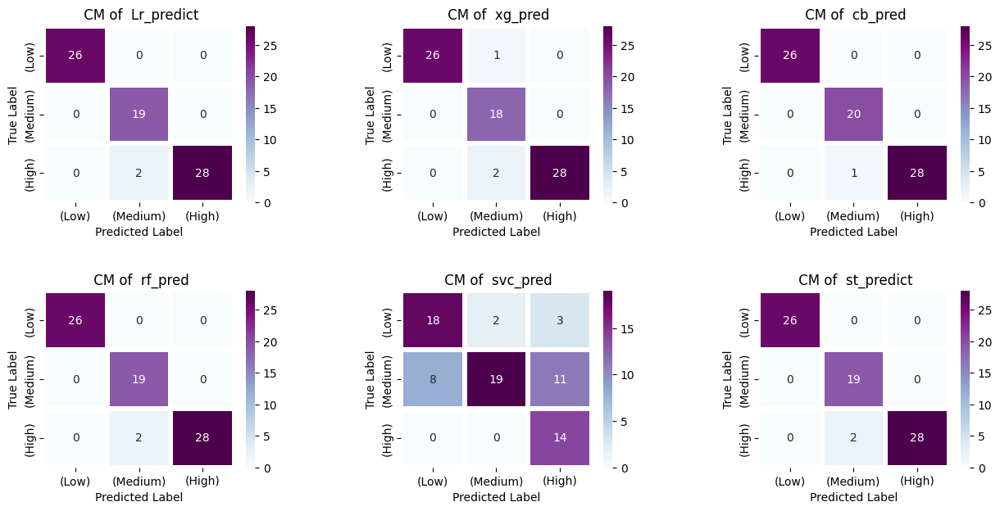

In [345]:
from sklearn.metrics import confusion_matrix
models_predictions=[lr_predict,xg_predict,cb_predict,rf_predict,svc_predict,st_predict]
model={1:'Lr_predict',2:'xg_pred',3:'cb_pred',4:'rf_pred',5:'svc_pred',6:'st_predict'}


plt.figure(figsize=(15,7))
for i,y_pred in enumerate(models_predictions,1) :
    
    cm = confusion_matrix(y_pred,y_test)
    
    plt.subplot(2,3,i)
    sns.heatmap(cm,cmap='BuPu',linewidth=3,fmt='',annot=True,
                xticklabels=['(Low)','(Medium)','(High)'],
                yticklabels=['(Low)','(Medium)','(High)'])
    
    
    plt.title(' CM of  '+ model[i])
    plt.xlabel('Predicted Label')
    plt.ylabel('True Label')
    plt.subplots_adjust(hspace=0.5,wspace=0.5)

In [31]:
#DUMPING THE MODEL
pkl.dump(ot_occuapation,open('../Models/Occupation_transform.pkl','wb'))
pkl.dump(ot_gender,open('../Models/Gender_transform.pkl','wb'))
pkl.dump(lt,open('../Models/Output_transform.pkl','wb'))
pkl.dump(cb,open('../Models/Model.pkl','wb'))






<img src="../images/Thanks.png" width='800px' height="50px">